In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from imutils.object_detection import non_max_suppression
from transformers import TrOCRProcessor
from transformers import VisionEncoderDecoderModel
import torch
from ultralytics import YOLO

In [2]:
for filename in os.listdir("images"):
    img = cv2.imread("images/"+filename)
    print(filename, img.shape)

T_22.jpg (1280, 1280, 3)
frames_84ho0sdHiQo_1.jpg (1280, 1280, 3)
oMG_75.jpg (1280, 1280, 3)
1_5OVbGRY0NTU_10.jpg (1280, 1280, 3)
XelsngKkXXc_56.jpg (1280, 1280, 3)
2U3J6aJ1Nxs_1.jpg (1280, 1280, 3)
frames_Kr4V0_8Rqo8_7.jpg (1280, 1280, 3)
nUGv1ZTCldc_15.jpg (1280, 1280, 3)
nUGv1ZTCldc_17.jpg (1280, 1280, 3)
frames_Kr4V0_8Rqo8_5.jpg (1280, 1280, 3)
XelsngKkXXc_54.jpg (1280, 1280, 3)
oMG_89.jpg (1280, 1280, 3)
11_5OVbGRY0NTU_5.jpg (1280, 1280, 3)
GUAf6isWbpM_9.jpg (1280, 1280, 3)
9_5OVbGRY0NTU_3.jpg (1280, 1280, 3)
frames_84ho0sdHiQo_3.jpg (1280, 1280, 3)
T_18.jpg (1280, 1280, 3)
0ZY1v7ttOk_38_7.jpg (1280, 1280, 3)
nUGv1ZTCldc_12.jpg (1280, 1280, 3)
frames_I9LY5DSKdsk_2.jpg (1280, 1280, 3)
oMG_67.jpg (1280, 1280, 3)
gmzO5Wx-LUY_9.jpg (1280, 1280, 3)
frames_Kr4V0_8Rqo8_3.jpg (1280, 1280, 3)
frames_84ho0sdHiQo_4.jpg (1280, 1280, 3)
oMG_70.jpg (1280, 1280, 3)
oMG_58.jpg (1280, 1280, 3)
2_5OVbGRY0NTU_11.jpg (1280, 1280, 3)
oMG_65.jpg (1280, 1280, 3)
10_5OVbGRY0NTU_4.jpg (1280, 1280, 3)
fram

### All images are the same size

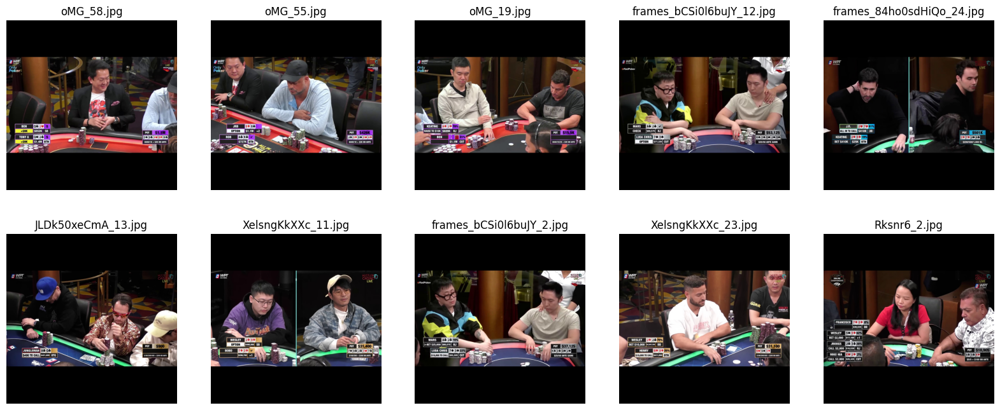

In [40]:
files = os.listdir("images")
# choose random 10 images
files = np.random.choice(files, 10)
fig, ax = plt.subplots(2, 5, figsize=(20, 8))
for i, filename in enumerate(files):
    img = cv2.imread("images/"+filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[i//5, i%5].imshow(img)
    ax[i//5, i%5].set_title(filename)
    ax[i//5, i%5].axis("off")



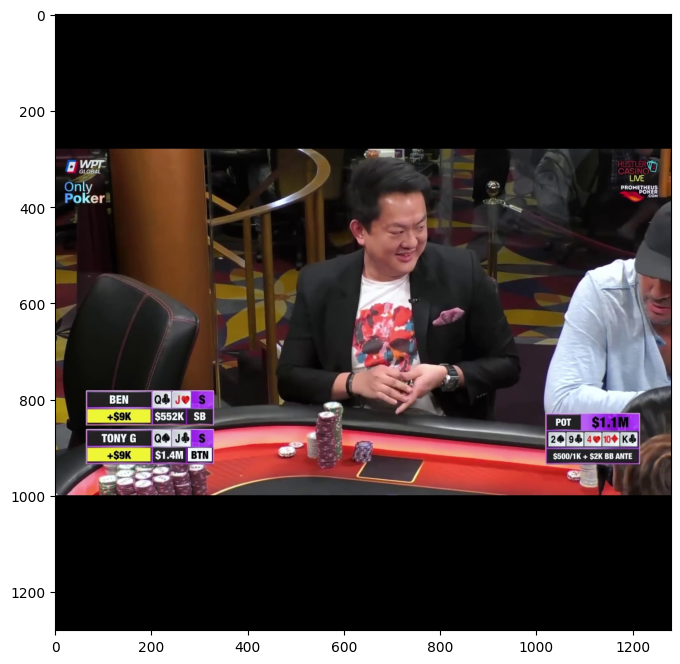

In [41]:
img = cv2.imread("images/"+files[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8, 8))
plt.imshow(img)

### All images seem to have 280 pixels height of just black from the top and bottom of the images. We can crop them out.
### The images also seem to have the player info cards towards the left, so we can take just that.

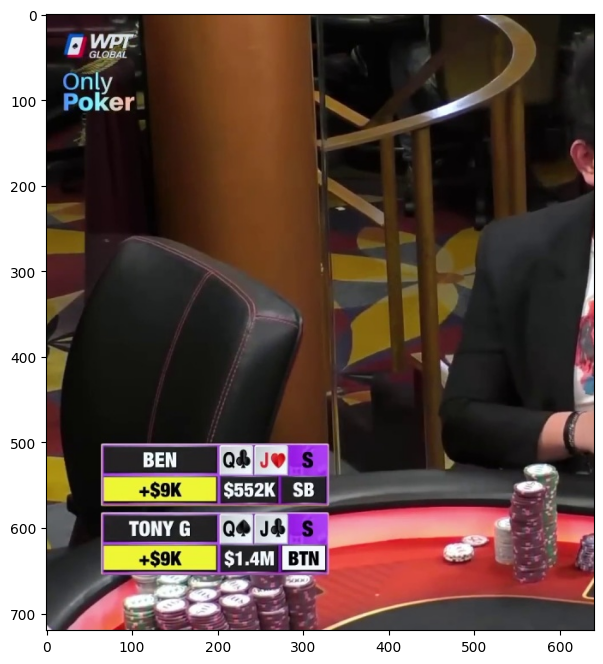

In [42]:
def crop_image(img):
    img = img[280:-280, :]
    img = img[:, :img.shape[1]//2]
    return img

img = cv2.imread("images/"+files[0])
img = crop_image(img)
color_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8, 8))
plt.imshow(color_img)

## I've made a function to calculate the mean values too for mean-centering of the image, which will be done in the get_bounding_boxes function below.

In [43]:
def calculate_mean(image):
    image_float = image.astype(np.float32)
    mean_values = np.mean(image_float, axis=(0, 1))
    mean_values = [float(x) for x in mean_values]
    return tuple(mean_values)

# EAST Algorithm
### I have used the EAST algorithm to detect the bounding boxes of the text in the images. The algorithm is described in the paper [here](https://arxiv.org/pdf/1704.03155.pdf). The algorithm's implementation is taken as reference from [here](https://www.pyimagesearch.com/2018/08/20/opencv-text-detection-east-text-detector/). The algorithm is implemented in the get_bounding_boxes function below.

In [44]:
def merge_overlapping_boxes(boxes): # This also allows to merge any boxes that are close to each other in a line horizontally
    boxes = sorted(boxes, key=lambda x: x[1])
    merged_boxes = []
    i = 0
    while i < len(boxes):
        box = boxes[i]
        if i == len(boxes) - 1:
            merged_boxes.append(box)
            break
        next_box = boxes[i+1]
        if abs(box[1] - next_box[1]) < 5:
            if abs(box[2] - next_box[0]) < 60:
                merged_boxes.append((box[0], box[1], next_box[2], next_box[3]))
                i += 2
            elif abs(box[0] - next_box[2]) < 60:
                merged_boxes.append((box[2], box[1], next_box[0], next_box[3]))
                i += 2
            else:
                merged_boxes.append(box)
                i += 1
        else:
            merged_boxes.append(box)
            i += 1
    return merged_boxes
            


def get_bounding_boxes(image):
    (H, W) = image.shape[:2]
    layerNames = [
        "feature_fusion/Conv_7/Sigmoid",
        "feature_fusion/concat_3"]
    # load the pre-trained EAST text detector
    net = cv2.dnn.readNet("frozen_east_text_detection.pb")
    # construct a blob from the image and then perform a forward pass of
    # the model to obtain the two output layer sets
    # Convert the image to floating-point format
    blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),mean=calculate_mean(image), swapRB=True, crop=False)
    net.setInput(blob)
    (scores, geometry) = net.forward(layerNames)

    (numRows, numCols) = scores.shape[2:4]
    rects = []
    confidences = []
    # loop over the number of rows
    for y in range(0, numRows):
        # extract the scores (probabilities), followed by the geometrical
        # data used to derive potential bounding box coordinates that
        # surround text
        scoresData = scores[0, 0, y]
        xData0 = geometry[0, 0, y]
        xData1 = geometry[0, 1, y]
        xData2 = geometry[0, 2, y]
        xData3 = geometry[0, 3, y]
        anglesData = geometry[0, 4, y]

        # loop over the number of columns
        for x in range(0, numCols):
            # if our score does not have sufficient probability, ignore it
            if scoresData[x] < 0.8:
                continue
            # compute the offset factor as our resulting feature maps will
            # be 4x smaller than the input image
            (offsetX, offsetY) = (x * 4.0, y * 4.0)
            # extract the rotation angle for the prediction and then
            # compute the sin and cosine
            angle = anglesData[x]
            cos = np.cos(angle)
            sin = np.sin(angle)
            # use the geometry volume to derive the width and height of
            # the bounding box
            h = xData0[x] + xData2[x]
            w = xData1[x] + xData3[x]
            # compute both the starting and ending (x, y)-coordinates for
            # the text prediction bounding box
            endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
            endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
            startX = int(endX - w)
            startY = int(endY - h)
            # add the bounding box coordinates and probability score to
            # our respective lists
            rects.append((startX, startY, endX, endY))
            confidences.append(scoresData[x])

    # apply non-maxima suppression to suppress weak, overlapping bounding
    # boxes
    boxes = non_max_suppression(np.array(rects), probs=confidences)
    # loop over the bounding boxes
    

    boxes = merge_overlapping_boxes(boxes)
    
    # draw the bounding boxes on the image
    for (startX, startY, endX, endY) in boxes:
        cv2.rectangle(image, (startX, startY), (endX, endY), (0, 255, 0), 2)
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    return boxes

## I had to implement the merging of overlapping boxes as the EAST Algorithm was sometimes detecting first name and last name as separate boxes.

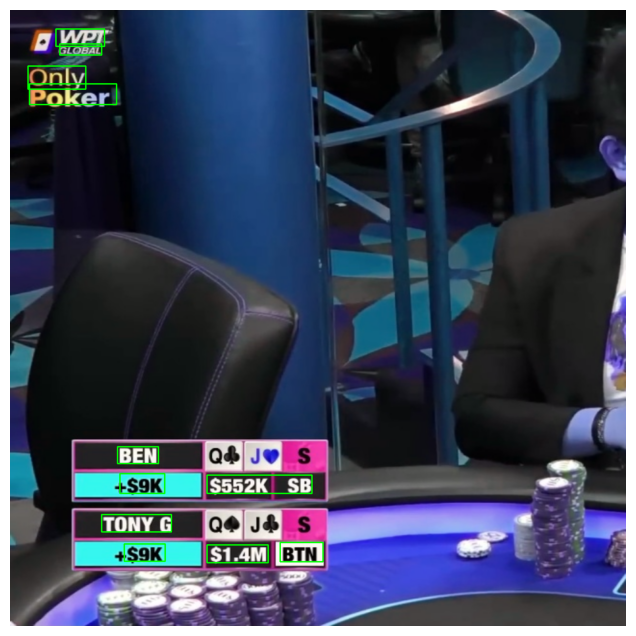

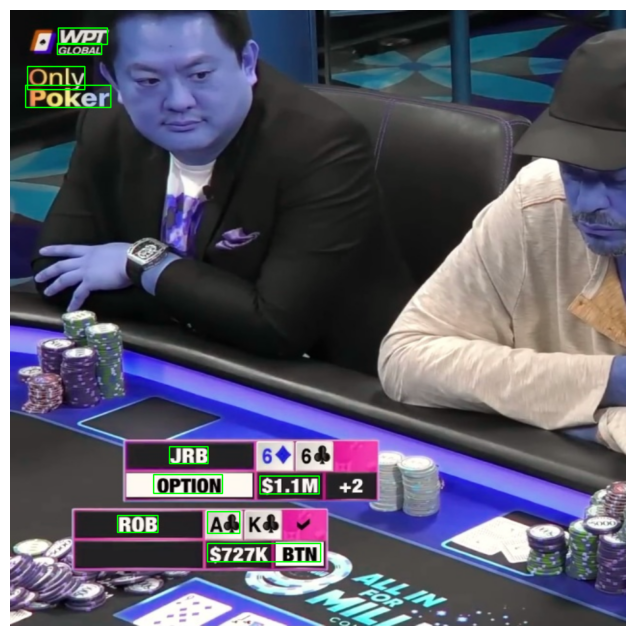

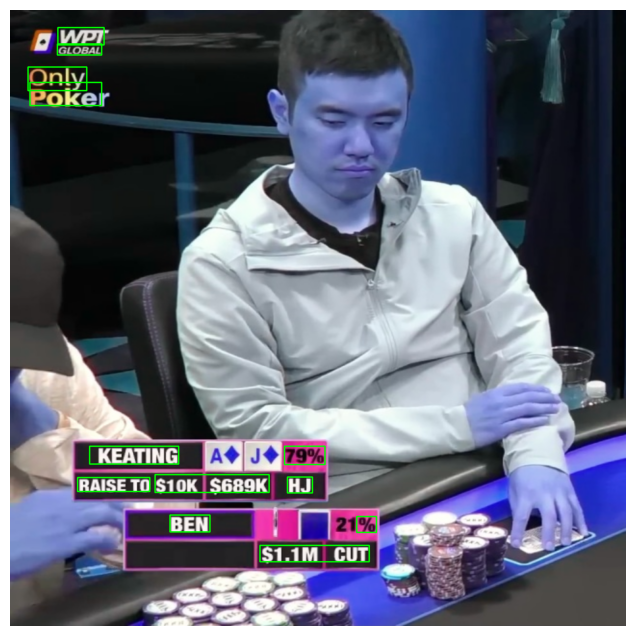

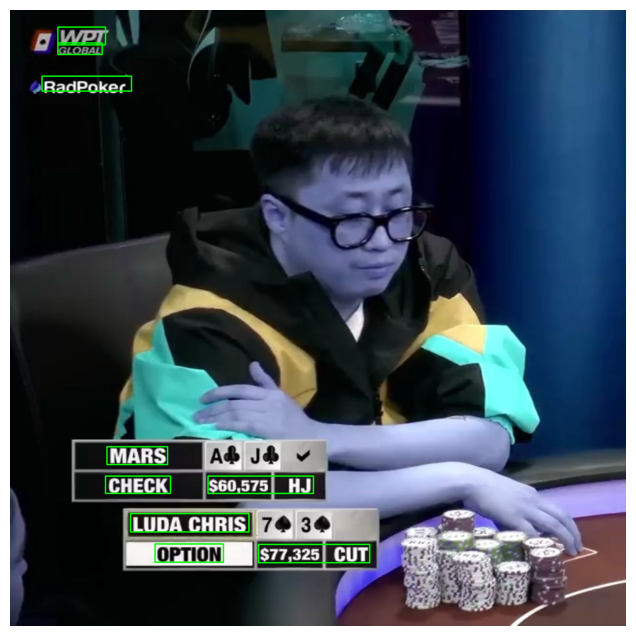

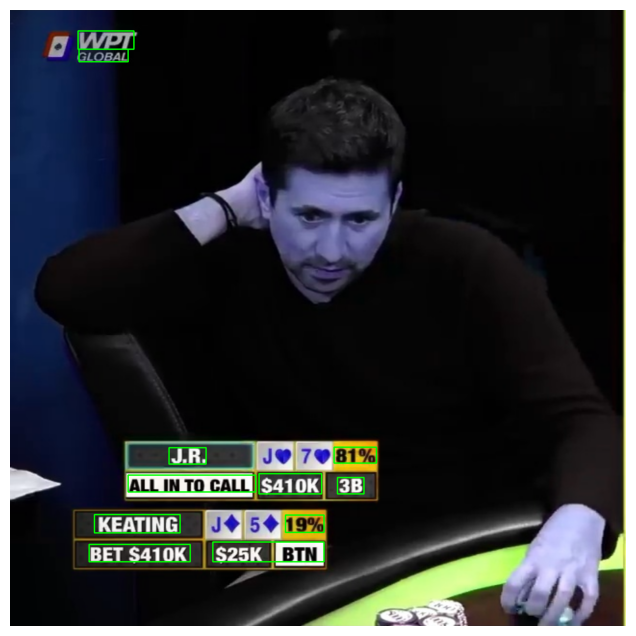

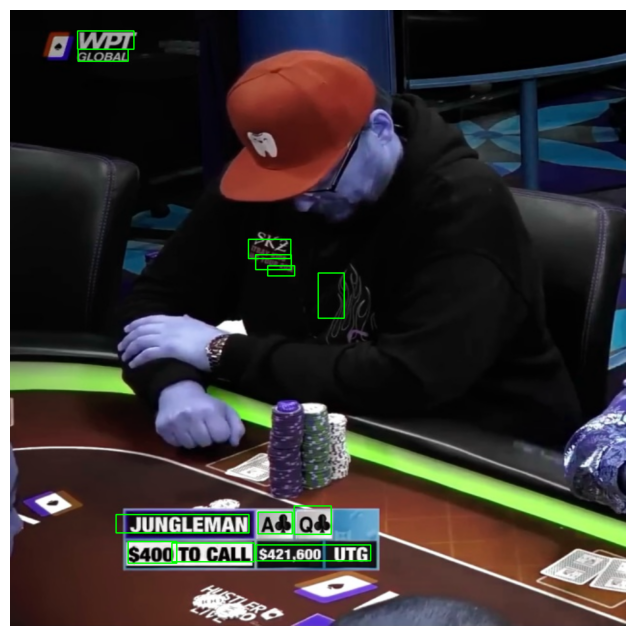

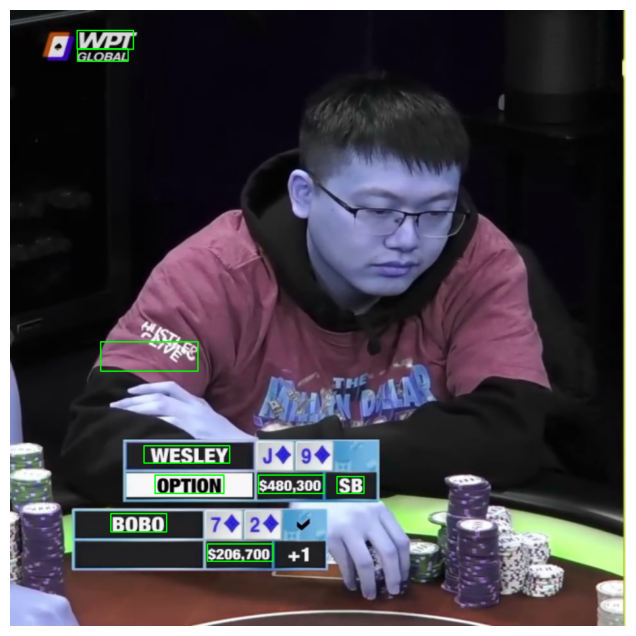

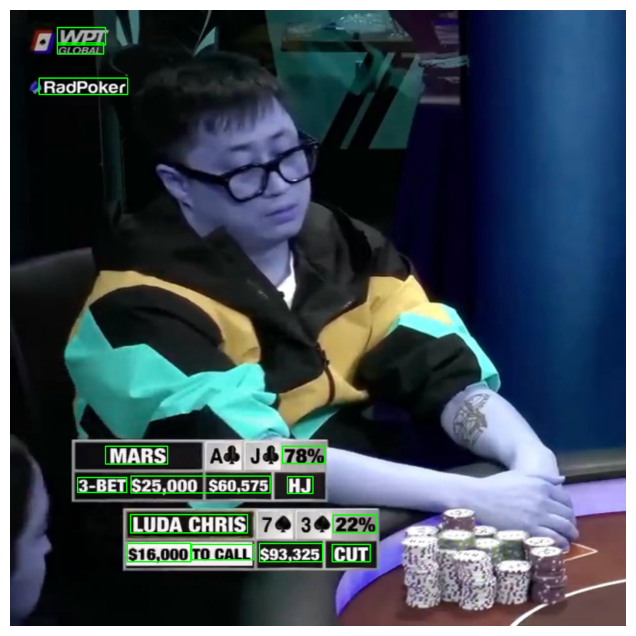

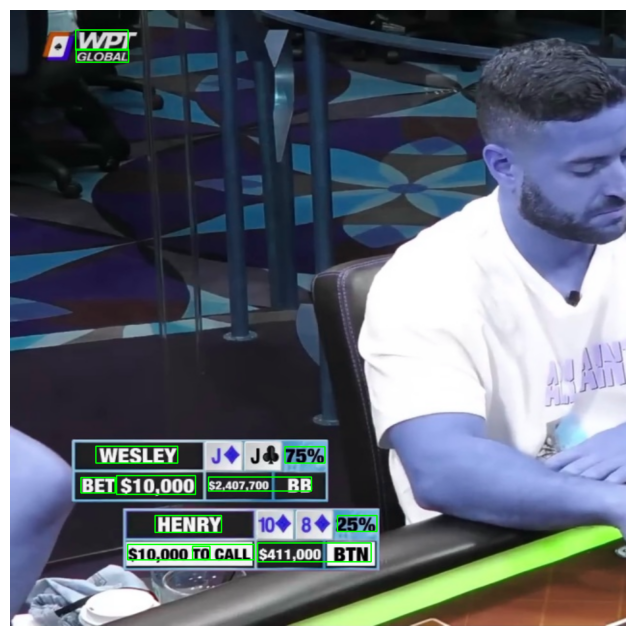

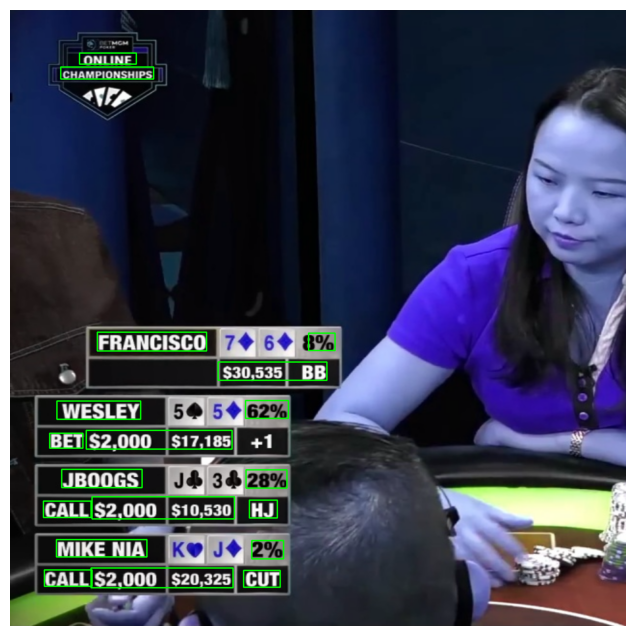

In [45]:
for i in range(len(files)):
    img = cv2.imread("images/"+files[i])
    img = crop_image(img)
    img = cv2.resize(img, (1280, 1280))
    boxes = get_bounding_boxes(img)

# We can see that +1 and +2 are not being detected. I tried resizing the images to different formats and it did work at detecting +1 and +2 but it negatively affected the other detections too so it was not worth it. We will probably have to use YOLO. 

## I gathered some data from the actual youtube channel itself as I did not want to train it on the validation data as it would overfit. I labelled it using Roboflow (augmented it and added background images too) and trained it on google colab to speed up the training process using their GPU. The colab notebook is also available in this repo named as "Colab Yolo training.ipynb".

In [84]:
# I don't have a gpu
model=YOLO("best.onnx") # onnx model better suited and faster for cpu inference according to ULtralytics

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify', or 'pose'.


image 1/1 /Users/arzaan/PycharmProjects/bleedai/images/oMG_58.jpg: 1280x1280 3 info-cardss, 1711.5ms
Speed: 19.5ms preprocess, 1711.5ms inference, 2.4ms postprocess per image at shape (1, 3, 1280, 1280)
image 1/1 /Users/arzaan/PycharmProjects/bleedai/images/oMG_55.jpg: 1280x1280 2 info-cardss, 1593.6ms
Speed: 6.5ms preprocess, 1593.6ms inference, 1.1ms postprocess per image at shape (1, 3, 1280, 1280)
image 1/1 /Users/arzaan/PycharmProjects/bleedai/images/oMG_19.jpg: 1280x1280 3 info-cardss, 2180.4ms
Speed: 5.4ms preprocess, 2180.4ms inference, 1.6ms postprocess per image at shape (1, 3, 1280, 1280)
image 1/1 /Users/arzaan/PycharmProjects/bleedai/images/frames_bCSi0l6buJY_12.jpg: 1280x1280 3 info-cardss, 3026.4ms
Speed: 7.7ms preprocess, 3026.4ms inference, 1.6ms postprocess per image at shape (1, 3, 1280, 1280)
image 1/1 /Users/arzaan/PycharmProjects/bleedai/images/frames_84ho0sdHiQo_24.jpg: 1280x1280 2 info-cardss, 2946.3ms
Speed: 8.0ms preprocess, 2946.3ms inference, 1.5ms postproce

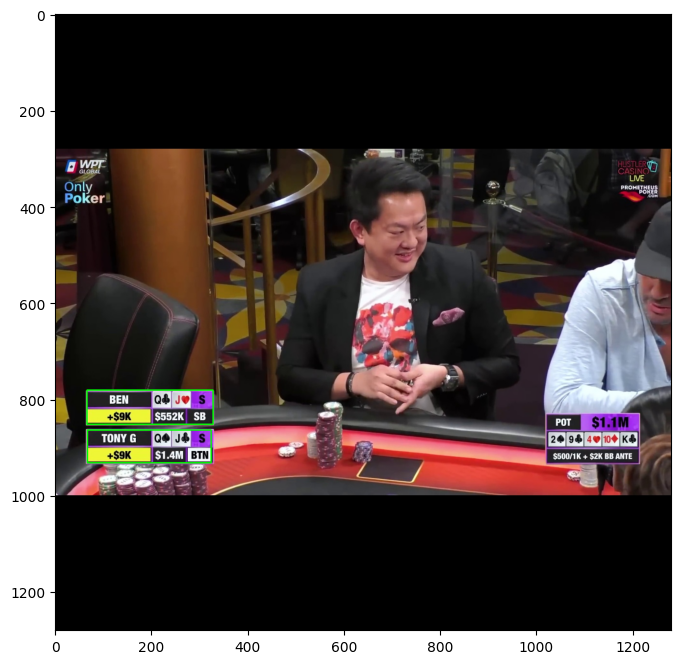

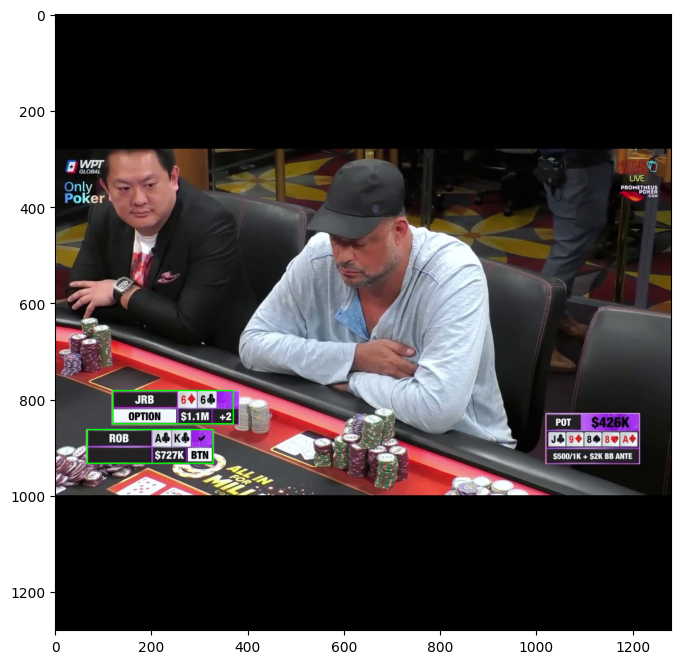

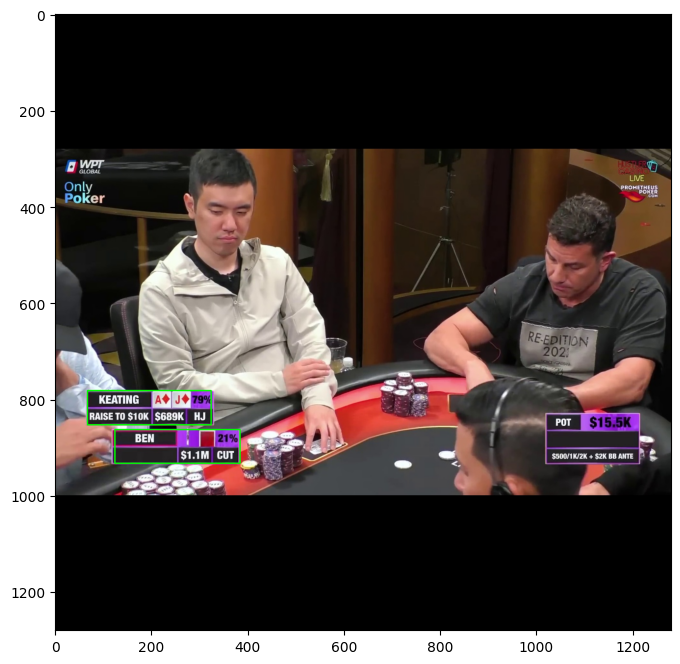

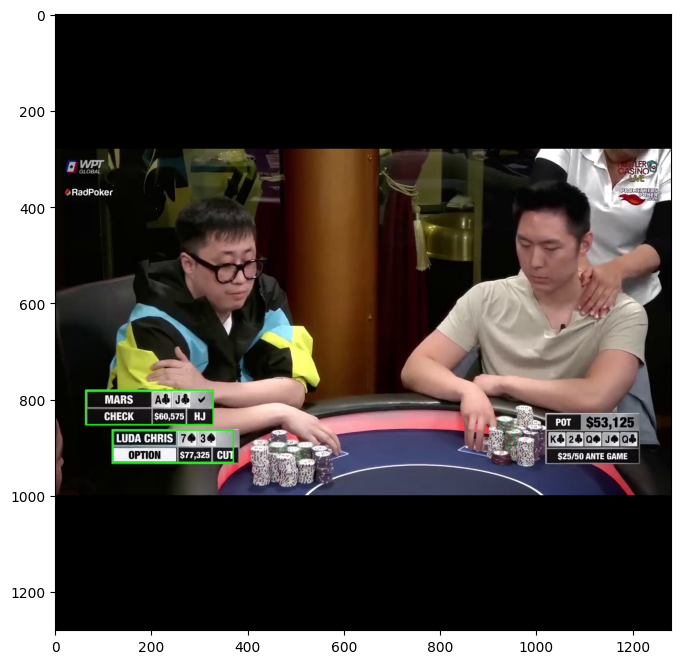

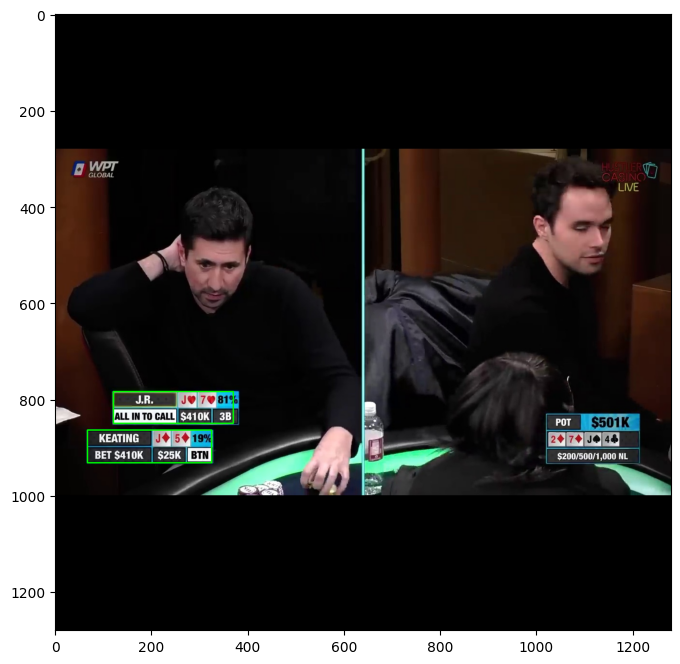

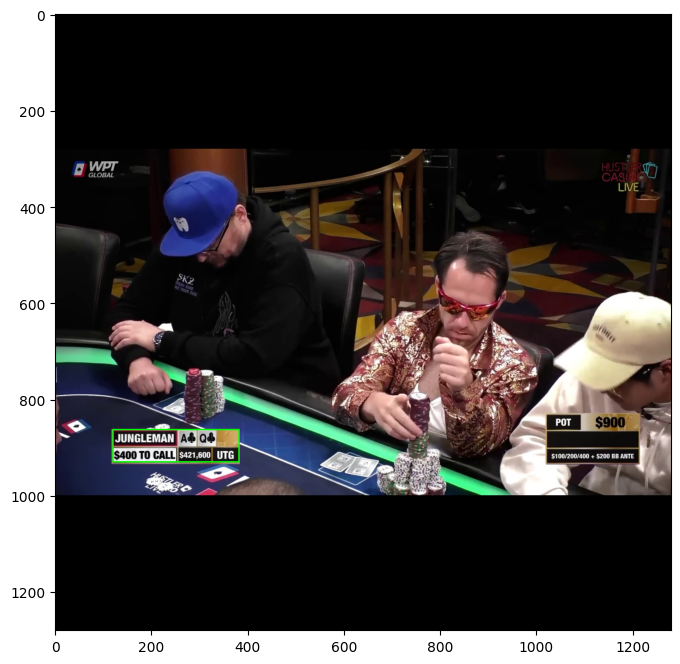

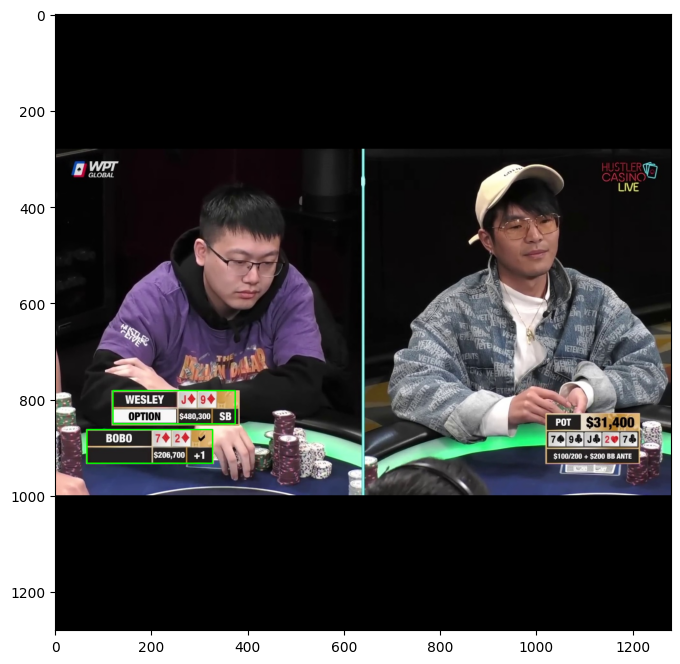

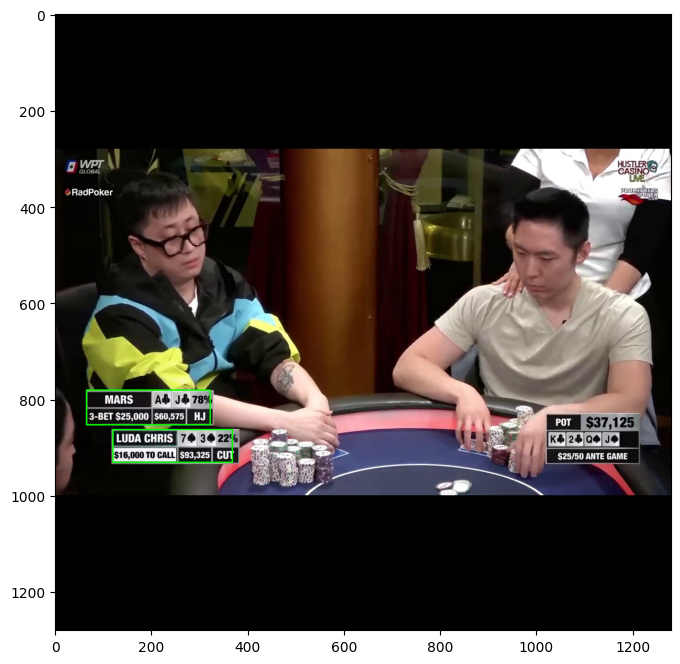

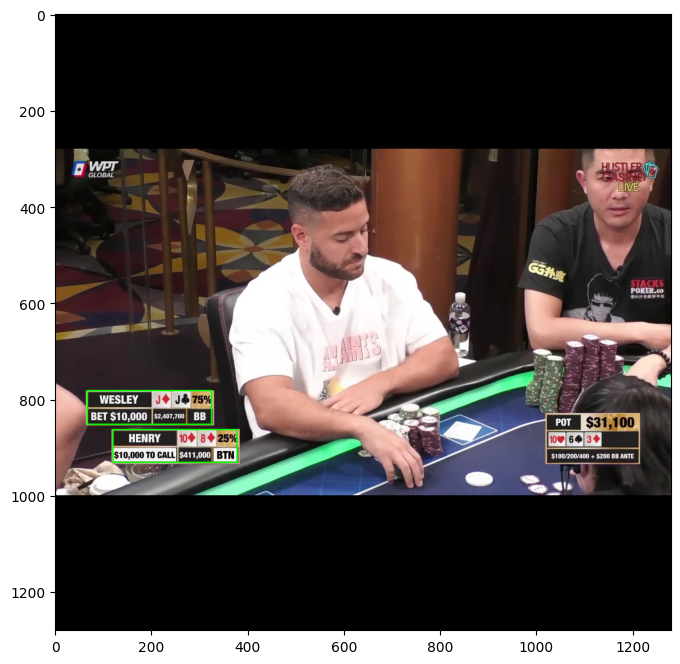

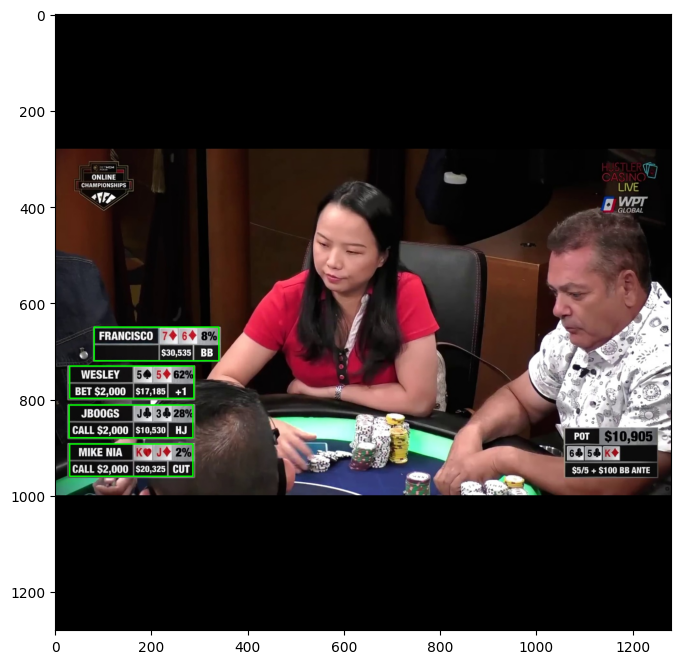

In [46]:
for image in files:
    results = model.predict("images/"+image, imgsz=1280)
    result = results[0]
    final_boxes = []
    for box in result.boxes:
      cords = box.xyxy[0].tolist()
      cords = [round(x) for x in cords]
      conf = round(box.conf[0].item(), 2)
      if conf > 0.5:
        final_boxes.append(cords)
    
        # merge overlapping boxes
    merged_boxes = []

    for box in final_boxes:
        box_merged = False
        for i, merged_box in enumerate(merged_boxes):
            if (
                box[0] >= merged_box[0] and box[1] >= merged_box[1] and
                box[2] <= merged_box[2] and box[3] <= merged_box[3]
            ):
                # box is completely inside an existing merged box
                box_merged = True
                break
            elif (
                box[0] <= merged_box[2] and box[1] <= merged_box[3] and
                box[2] >= merged_box[0] and box[3] >= merged_box[1]
            ):
                # box is overlapping with an existing merged box
                merged_boxes[i] = [
                    min(box[0], merged_box[0]),
                    min(box[1], merged_box[1]),
                    max(box[2], merged_box[2]),
                    max(box[3], merged_box[3])
                ]
                box_merged = True
                break

        if not box_merged:
            merged_boxes.append(box)            
            
            

    img = cv2.imread("images/"+image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for box in merged_boxes:
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    
      

# This seems to work perfectly. Now we just have to split the images into individual lines images and pass them to the OCR model. Let's make some functions to do that.

Loading best.onnx for ONNX Runtime inference...
image 1/1 /Users/arzaan/PycharmProjects/bleedai/images/frames_84ho0sdHiQo_1.jpg: 1280x1280 4 info-cardss, 4445.3ms
Speed: 9.7ms preprocess, 4445.3ms inference, 29.0ms postprocess per image at shape (1, 3, 1280, 1280)


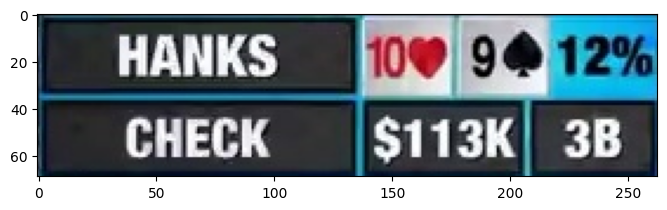

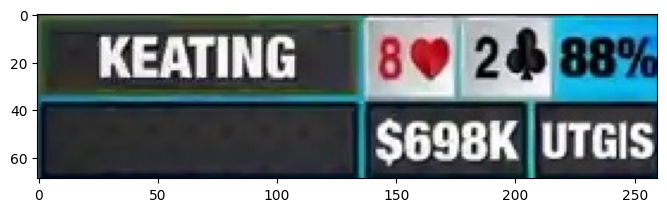

In [85]:
def get_bounding_boxes_YOLO(img_path):
    results = model.predict(img_path, imgsz=1280)
    result = results[0]
    final_boxes = []
    for box in result.boxes:
      cords = box.xyxy[0].tolist()
      cords = [round(x) for x in cords]
      conf = round(box.conf[0].item(), 2)
      if conf > 0.5:
        final_boxes.append(cords)
    
        # merge overlapping boxes
    merged_boxes = []

    for box in final_boxes:
        box_merged = False
        for i, merged_box in enumerate(merged_boxes):
            if (
                box[0] >= merged_box[0] and box[1] >= merged_box[1] and
                box[2] <= merged_box[2] and box[3] <= merged_box[3]
            ):
                # box is completely inside an existing merged box
                box_merged = True
                break
            elif (
                box[0] <= merged_box[2] and box[1] <= merged_box[3] and
                box[2] >= merged_box[0] and box[3] >= merged_box[1]
            ):
                # box is overlapping with an existing merged box
                merged_boxes[i] = [
                    min(box[0], merged_box[0]),
                    min(box[1], merged_box[1]),
                    max(box[2], merged_box[2]),
                    max(box[3], merged_box[3])
                ]
                box_merged = True
                break

        if not box_merged:
            merged_boxes.append(box)   
    return merged_boxes

def draw_bounding_boxes(img_path, boxes):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for box in boxes:
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis("off")
    
def crop_image_according_to_boxes(img_path, boxes):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cropped_images = []
    for box in boxes:
        cropped_images.append(img[box[1]:box[3], box[0]:box[2]])
    return cropped_images

boxes = get_bounding_boxes_YOLO("images/frames_84ho0sdHiQo_1.jpg")
images = crop_image_according_to_boxes("images/frames_84ho0sdHiQo_1.jpg", boxes)
for image in images:
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

## For each image, we will split it into two lines and get the information using the OCR

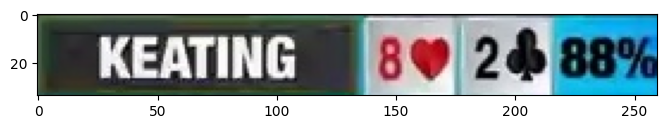

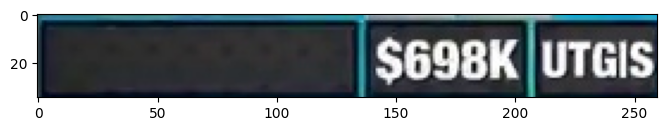

In [90]:
def split_image(image):
    image1 = image[:image.shape[0]//2, :]
    image2 = image[image.shape[0]//2:, :]
    return image1, image2

temp = []
for image in images[1:]:
    image1, image2 = split_image(image)
    temp.append(image1)
    temp.append(image2)
    plt.figure(figsize=(8, 8))
    plt.imshow(image1)
    plt.figure(figsize=(8, 8))
    plt.imshow(image2)
    break
    
    


In [61]:
ocr_processor = TrOCRProcessor.from_pretrained("microsoft/trocr-large-stage1")
ocr_model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-large-stage1")

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-large-stage1 and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [107]:
texts = []
for image in temp:
    pixel_values = ocr_processor(image, return_tensors="pt").pixel_values
    generated_ids = ocr_model.generate(pixel_values)
    generated_text = ocr_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    texts.append(generated_text)
    print(generated_text)

KEATING 80 24 88%
$698K UTGIS


### This seems to work perfectly. Now I just have to identify the names and positions out of these. I'll use NER using BERT for the names, and a simple search across the texts for the positions.

In [108]:
for i in range(len(texts)):
    texts[i] = texts[i].split()
    
for i in range(len(texts)):
    texts[i] = [x.title() for x in texts[i]]
    
texts

[['Keating', '80', '24', '88%'], ['$698K', 'Utgis']]

In [109]:
from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline

tokenizer = AutoTokenizer.from_pretrained("dslim/bert-base-NER")
bert_model = AutoModelForTokenClassification.from_pretrained("dslim/bert-base-NER")

nlp = pipeline("ner", model=bert_model, tokenizer=tokenizer)

name = []
name_found = False
    for text in texts:
        if name_found:
            break
        for t in text:
            ner_result = nlp(t)
            for i in range(len(ner_result)):
                if ner_result[i]["entity"] == "B-PER" or ner_result[i]["entity"] == "I-PER":
                    name = t
                    name_found = True
                    break
            if name_found:
                break
            
print(name)
    



Some weights of the model checkpoint at dslim/bert-base-NER were not used when initializing BertForTokenClassification: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Keating


In [110]:
possible_poker_positions = ["btn", "utg", "bb", "hj", "cut", "sb", "3b","utgis", "+1","+2"] 
texts = [item for sublist in texts for item in sublist]
for t in texts:
    if t.lower() in possible_poker_positions:
        print(t.upper())
        break

UTGIS


# Now I can make the final pipeline. You can find it in final.py